

[PRESENTACION](https://www.canva.com/design/DAFhzk6-ztc/Pr4i5KDFVKlsk0Dpagzyug/edit?utm_content=DAFhzk6-ztc&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton)



GITHUB


# Situación

La empresa de 15.000 colaboradores enfrenta 3.571 Renuncias anuales, lo que equivale a un Attrition del 23%


Fuente del Dataset: 
https://www.kaggle.com/datasets/krismurphy01/data-lab?select=HR_Engagement_Sat_Sales_UpdatedV4.0.csv

# El problema

El costo por cada colaborador que renuncia equivale a  su sueldo anual.

Esto equivale a decir que podemos cuantificar nuestro problema estimandolo en:

3.571 Sueldos Anuales
23% Costo adicional pagado en estos sueldos.


[Artículo Josh Bersin](https://www.linkedin.com/pulse/20130816200159-131079-employee-retention-now-a-big-issue-why-the-tide-has-turned/) 

# Objetivo

**El objetivo del presente trabajo es gestionar el Nivel de Renuncia, maximizando la inversión necesaria y los resultados esperados.**




# Propuestas:

**Propuesta A)**

No hacer nada.

**Mantener el problema y sus costos asociados.**

**Propuesta B)**

Invertir mucho dinero en 15.000 colaboradores

Invertir en todas las temáticas 

**Seguramente pueda generar alguna mejora en el Attrition**

**Propuesta C)**

Proponemos:
Accionar SOLO sobre una población mínima.
Accionar SOLO sobre una temática por segmento.

**PROPONEMOS UNA INVERSION:**
*  **MÍNIMA**
*  **MUY PRECISA**
*  **Y CON ALTO IMPACTO SOBRE EL ATTRITION.**

# Proyecto

A FIN DE ACTUAR Y TOMAR MEDIDAS PARA ACCIONAR PARA EVITAR LAS RENUNCIAS NOS DISPONEMOS A:

*  Estudiar la información.
*  Predecir quién tiene mayor probabilidad de renunciar.
*  Identificar los factores o temáticas que más inciden en los niveles de renuncia o no renuncia.
*  Identificar las áreas o temáticas a trabajar.
*  Identificar la población sobre la cual trabajar.

# Análisis Exploratorio

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd 

In [2]:
from google.colab import drive
import os
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
%cd '/content/gdrive/MyDrive/DS'
dsM = pd.read_csv('dataset_04.csv',sep=',') #Importo
dsM.dropna(subset=['Men_Leave'], inplace=True) #Me quedo con los Masculinos sin NaN

/content/gdrive/MyDrive/DS


In [4]:
%cd '/content/gdrive/MyDrive/DS'
dsF = pd.read_csv('dataset_04.csv',sep=',') #importo
dsF = dsF[(dsF.Gender == "F")] #Me quedo con los Femeninos, que están todos ok.

ds1 = pd.merge(dsM, dsF, how='outer') # Hago un merge para unir los Masculinos y los Femeninos en un dataset final.

/content/gdrive/MyDrive/DS


In [5]:
# Elimino los campos "Rissing Star" y "CSR Factor" dado que en la mayoria de los registros están vacíos.
ds1.drop('Rising_Star', axis= 1, inplace=True)
ds1.drop('CSR Factor', axis= 1, inplace=True)


In [6]:
# Remplazamos los vacios en Critical, considerando que si no estan identificados como critícos no lo son.
ds1['Critical'].fillna(0, inplace=True)

In [7]:
# Eliminamos los registros en los que 'EMP_Sat_OnPrem_1' está vacío.
ds1.dropna(subset=['EMP_Sat_OnPrem_1'], inplace=True)

In [8]:
# Revisamos las estadísticas de los registros.
ds1.describe()

,ID,Will_Relocate,Critical,Trending Perf,Talent_Level,Validated_Talent_Level,Percent_Remote,EMP_Sat_OnPrem_1,EMP_Sat_OnPrem_2,EMP_Sat_OnPrem_3,...,Emp_Competitive_4,Emp_Competitive_5,Emp_Collaborative_1,Emp_Collaborative_2,Emp_Collaborative_3,Emp_Collaborative_4,Emp_Collaborative_5,Sensor_StepCount,Sensor_Heartbeat(Average/Min),Sensor_Proximity(1-highest/10-lowest)
count,12355.000000,12355.000000,12355.000000,12355.0,12355.0,12355.0,12355.000000,12355.0,12355.000000,12355.000000,...,12355.000000,12355.000000,12355.000000,12355.00000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000
mean,6809.119790,0.499636,0.038527,3.0,6.0,6.0,0.580121,3.0,2.680777,3.680777,...,3.008256,2.983084,2.976932,1.64824,3.005989,2.999191,3.017078,3103.687171,78.242979,6.690409
std,4306.687772,0.500020,0.192472,0.0,0.0,0.0,0.192177,0.0,0.732520,0.732520,...,1.408282,1.413168,1.413653,0.82504,1.409672,1.409340,1.411790,1744.792249,7.784133,2.501429
min,1.000000,0.000000,0.000000,3.0,6.0,6.0,0.400000,3.0,1.000000,2.000000,...,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1000.000000,60.000000,1.000000
25%,3110.500000,0.000000,0.000000,3.0,6.0,6.0,0.400000,3.0,3.000000,4.000000,...,2.000000,2.000000,2.000000,1.00000,2.000000,2.000000,2.000000,1597.000000,74.000000,6.000000
50%,6236.000000,0.000000,0.000000,3.0,6.0,6.0,0.500000,3.0,3.000000,4.000000,...,3.000000,3.000000,3.000000,2.00000,3.000000,3.000000,3.000000,2604.000000,78.000000,7.000000
75%,10557.500000,1.000000,0.000000,3.0,6.0,6.0,0.800000,3.0,3.000000,4.000000,...,4.000000,4.000000,4.000000,2.00000,4.000000,4.000000,4.000000,4509.000000,86.000000,9.000000
max,14868.000000,1.000000,1.000000,3.0,6.0,6.0,0.800000,3.0,3.000000,4.000000,...,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,8500.000000,90.000000,10.000000


In [9]:
# Generamos el campo Emp_engag_Prom para que contenga un promedio de las 5 encuentas de Engagment
ds1['EMP_Engag_Prom'] = ds1[['EMP_Engagement_1','EMP_Engagement_2','EMP_Engagement_3','EMP_Engagement_4','EMP_Engagement_5']].mean(axis=1)

In [10]:
# Generamos el campo EMP_Sat_On_P para que contenga un promedio de las 5 encuentas de Satisfaccion Presenciales
ds1['EMP_Sat_On_P'] = ds1[['EMP_Sat_OnPrem_1','EMP_Sat_OnPrem_2','EMP_Sat_OnPrem_3','EMP_Sat_OnPrem_4','EMP_Sat_OnPrem_5']].mean(axis=1)

In [11]:
# Generamos el campo EMP_Sat_On_P para que contenga un promedio de las 5 encuentas de Satisfaccion Remotos
ds1['EMP_Sat_Rem_P'] = ds1[['EMP_Sat_Remote_1','EMP_Sat_Remote_2','EMP_Sat_Remote_3','EMP_Sat_Remote_4','EMP_Sat_Remote_5']].mean(axis=1)

In [12]:
# Generamos el campo EMP_Sat_On_P para que contenga un promedio de Emp_Collaborative
ds1['Emp_Collaborative'] = ds1[['Emp_Collaborative_1','Emp_Collaborative_2','Emp_Collaborative_3','Emp_Collaborative_4','Emp_Collaborative_5']].mean(axis=1)

In [13]:
# Generamos el campo EMP_Sat_On_P para que contenga un promedio de Emp_Competitive
ds1['Emp_Competitive'] = ds1[['Emp_Competitive_1','Emp_Competitive_2','Emp_Competitive_3','Emp_Competitive_4','Emp_Competitive_5']].mean(axis=1)

In [14]:
# Eliminamos columnas no relevantes
ds1.drop(['Trending Perf','Talent_Level','Validated_Talent_Level'], axis=1, inplace=True)

In [15]:
# Revisamos las estadísticas de los campos mas relevantes
ds1.describe()

,ID,Will_Relocate,Critical,Percent_Remote,EMP_Sat_OnPrem_1,EMP_Sat_OnPrem_2,EMP_Sat_OnPrem_3,EMP_Sat_OnPrem_4,EMP_Sat_OnPrem_5,EMP_Sat_Remote_1,...,Emp_Collaborative_4,Emp_Collaborative_5,Sensor_StepCount,Sensor_Heartbeat(Average/Min),Sensor_Proximity(1-highest/10-lowest),EMP_Engag_Prom,EMP_Sat_On_P,EMP_Sat_Rem_P,Emp_Collaborative,Emp_Competitive
count,12355.000000,12355.000000,12355.000000,12355.000000,12355.0,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,...,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000,12355.000000
mean,6809.119790,0.499636,0.038527,0.580121,3.0,2.680777,3.680777,2.680777,3.933549,2.741724,...,2.999191,3.017078,3103.687171,78.242979,6.690409,3.521473,3.195176,3.539814,2.729486,2.587034
std,4306.687772,0.500020,0.192472,0.192177,0.0,0.732520,0.732520,0.732520,1.358168,0.746848,...,1.409340,1.411790,1744.792249,7.784133,2.501429,1.080815,0.701230,0.897919,0.585033,0.600316
min,1.000000,0.000000,0.000000,0.400000,3.0,1.000000,2.000000,1.000000,1.000000,2.000000,...,1.000000,1.000000,1000.000000,60.000000,1.000000,1.800000,1.600000,2.400000,1.000000,1.000000
25%,3110.500000,0.000000,0.000000,0.400000,3.0,3.000000,4.000000,3.000000,4.000000,2.000000,...,2.000000,2.000000,1597.000000,74.000000,6.000000,1.800000,3.400000,2.400000,2.400000,2.200000
50%,6236.000000,0.000000,0.000000,0.500000,3.0,3.000000,4.000000,3.000000,4.000000,3.000000,...,3.000000,3.000000,2604.000000,78.000000,7.000000,4.200000,3.400000,4.200000,2.800000,2.600000
75%,10557.500000,1.000000,0.000000,0.800000,3.0,3.000000,4.000000,3.000000,5.000000,3.000000,...,4.000000,4.000000,4509.000000,86.000000,9.000000,4.200000,3.600000,4.200000,3.200000,3.000000
max,14868.000000,1.000000,1.000000,0.800000,3.0,3.000000,4.000000,3.000000,5.000000,5.000000,...,5.000000,5.000000,8500.000000,90.000000,10.000000,4.200000,3.600000,4.600000,5.000000,4.800000


In [16]:
ds1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12355 entries, 0 to 12402
Data columns (total 62 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   ID                                     12355 non-null  int64  
 1   Name                                   12353 non-null  object 
 2   Department                             12355 non-null  object 
 3   GEO                                    12355 non-null  object 
 4   Role                                   12355 non-null  object 
 5   Will_Relocate                          12355 non-null  int64  
 6   Critical                               12355 non-null  float64
 7   Percent_Remote                         12355 non-null  float64
 8   EMP_Sat_OnPrem_1                       12355 non-null  float64
 9   EMP_Sat_OnPrem_2                       12355 non-null  float64
 10  EMP_Sat_OnPrem_3                       12355 non-null  float64
 11  EM

In [17]:
# Generamos un dataset solo con los que renunciarton
ds2 = ds1[(ds1.left_Company == 1)]

In [18]:
# Revisamos las estadísticas de los campos mas relevantes de los renunciantes
ds2.describe()

,ID,Will_Relocate,Critical,Percent_Remote,EMP_Sat_OnPrem_1,EMP_Sat_OnPrem_2,EMP_Sat_OnPrem_3,EMP_Sat_OnPrem_4,EMP_Sat_OnPrem_5,EMP_Sat_Remote_1,...,Emp_Collaborative_4,Emp_Collaborative_5,Sensor_StepCount,Sensor_Heartbeat(Average/Min),Sensor_Proximity(1-highest/10-lowest),EMP_Engag_Prom,EMP_Sat_On_P,EMP_Sat_Rem_P,Emp_Collaborative,Emp_Competitive
count,3493.000000,3493.000000,3493.000000,3493.000000,3493.0,3493.000000,3493.000000,3493.000000,3493.000000,3493.000000,...,3493.000000,3493.000000,3493.000000,3493.000000,3493.000000,3.493000e+03,3493.000000,3493.000000,3493.000000,3493.000000
mean,7312.094475,0.491555,0.046378,0.610364,3.0,2.972516,3.972516,2.972516,4.420842,2.730031,...,2.968508,3.017177,2375.630404,78.823934,6.423991,1.800000e+00,3.467678,3.410822,2.742227,2.410535
std,5039.761607,0.500000,0.210333,0.199243,0.0,0.232867,0.232867,0.232867,0.639337,0.875140,...,1.409400,1.426609,2091.124190,10.413154,2.565693,4.441528e-16,0.241749,0.938808,0.588741,0.530472
min,446.000000,0.000000,0.000000,0.400000,3.0,1.000000,2.000000,1.000000,1.000000,2.000000,...,1.000000,1.000000,1001.000000,60.000000,1.000000,1.800000e+00,1.600000,2.400000,1.000000,1.000000
25%,2286.000000,0.000000,0.000000,0.400000,3.0,3.000000,4.000000,3.000000,4.000000,2.000000,...,2.000000,2.000000,1300.000000,69.000000,5.000000,1.800000e+00,3.400000,2.400000,2.400000,2.000000
50%,8805.000000,0.000000,0.000000,0.800000,3.0,3.000000,4.000000,3.000000,4.000000,3.000000,...,3.000000,3.000000,1597.000000,85.000000,7.000000,1.800000e+00,3.400000,4.200000,2.800000,2.400000
75%,12021.000000,1.000000,0.000000,0.800000,3.0,3.000000,4.000000,3.000000,5.000000,3.000000,...,4.000000,4.000000,1875.000000,88.000000,8.000000,1.800000e+00,3.600000,4.200000,3.200000,2.800000
max,14810.000000,1.000000,1.000000,0.800000,3.0,3.000000,4.000000,3.000000,5.000000,5.000000,...,5.000000,5.000000,8500.000000,90.000000,10.000000,1.800000e+00,3.600000,4.600000,4.800000,4.600000


Text(0.5, 1.0, 'Dispersión de Cantidad de Proyectos al año')

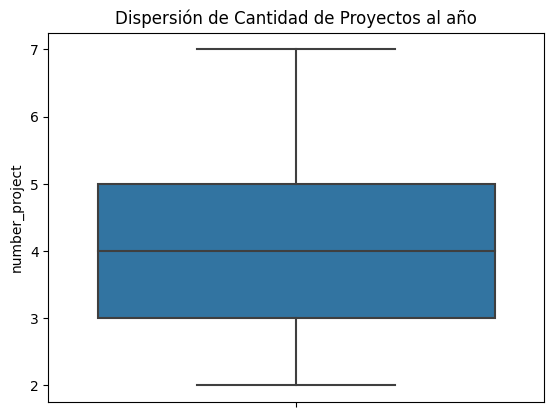

In [19]:
# Axis-level
ax = sns.boxplot(y="number_project", data=ds1)
plt.title('Dispersión de Cantidad de Proyectos al año')


Encontramos una dispersión en la población evaluada respecto a la cantidad anual de proyectos en lo que trabajan los colaboradores.

Text(0.5, 1.0, 'Renuncias segun Cantidad de Proyectos')

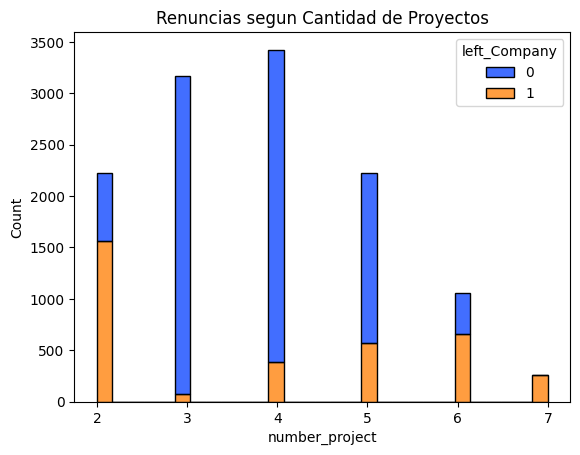

In [20]:
sns.histplot(data=ds1, x="number_project", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun Cantidad de Proyectos')

Al revisar los niveles de renuncia encontramos distintos comportamientos, entre los que se destacan que:

*   Con mas de 3 proyectos anuales, incrementa el % de renuncias conforme incrementan la cantidad de proyectos.

*   Con 7 proyectos el 100% termina renunciando.

*   Con sólo 2 proyectos anuales los niveles de renuncia son del 42%.





Text(0.5, 1.0, 'Renuncias segun la última evaluación')

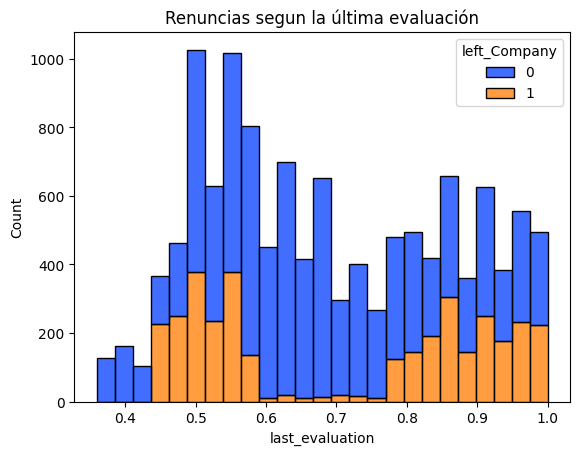

In [22]:
sns.histplot(data=ds1, x="last_evaluation", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun la última evaluación')

Text(0.5, 1.0, 'Renuncias segun el promedio de horas mensuales')

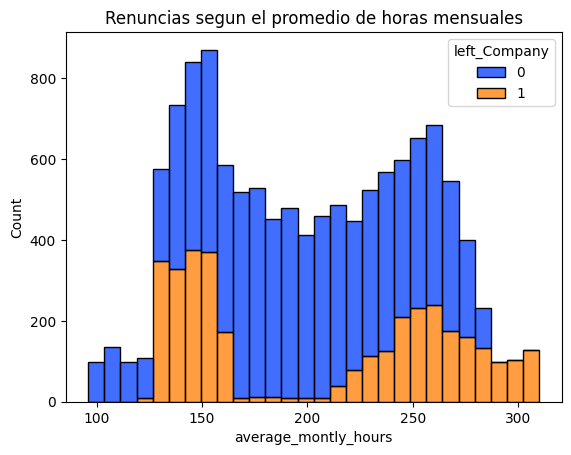

In [24]:

sns.histplot(data=ds1, x="average_montly_hours", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun el promedio de horas mensuales')

Text(0.5, 1.0, 'Renuncias segun años en la compañia')

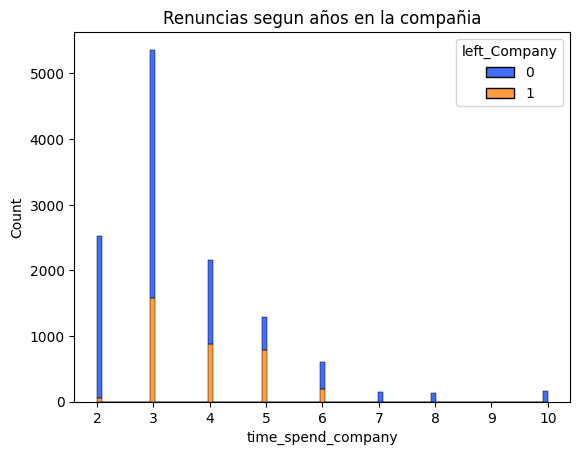

In [26]:
sns.histplot(data=ds1, x="time_spend_company", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun años en la compañia')

Text(0.5, 1.0, 'Renuncias segun Accidentes de trabajo')

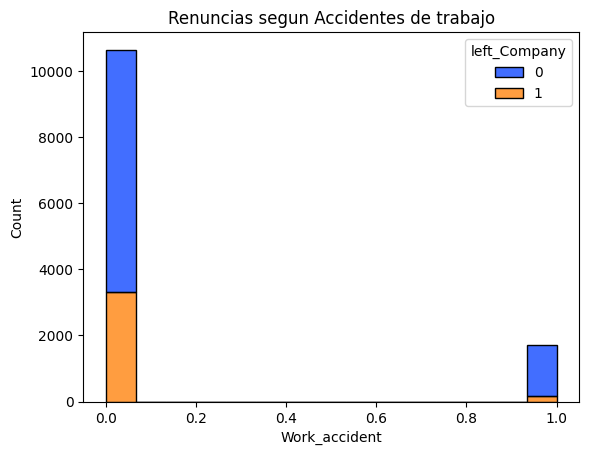

In [27]:
sns.histplot(data=ds1, x="Work_accident", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun Accidentes de trabajo')

Text(0.5, 1.0, 'Renuncias segun Promcociones en los últimos años')

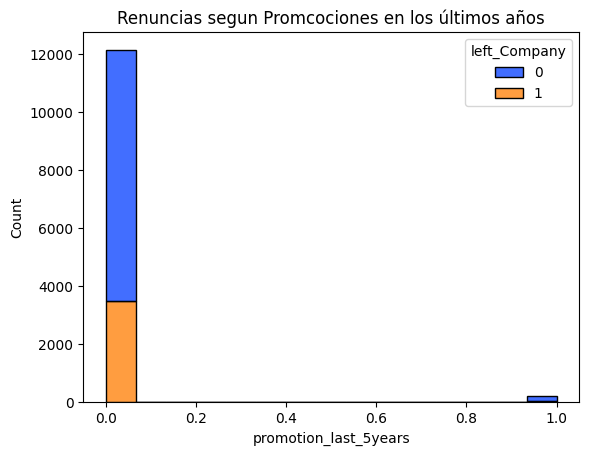

In [28]:
sns.histplot(data=ds1, x="promotion_last_5years", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun Promcociones en los últimos años')

Text(0.5, 1.0, 'Renunciantes y sus Promcociones en los últimos años')

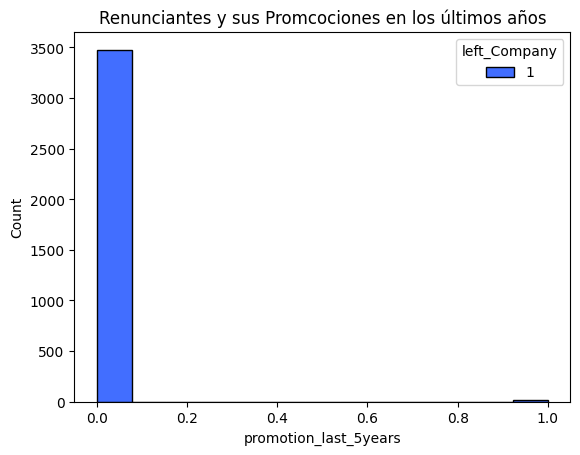

In [29]:
sns.histplot(data=ds2, x="promotion_last_5years", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renunciantes y sus Promcociones en los últimos años')

Todos los renunciantes no habian sido promovidos en los últimos 5 años.

Text(0.5, 1.0, 'Renuncias segun Nivel Salarial')

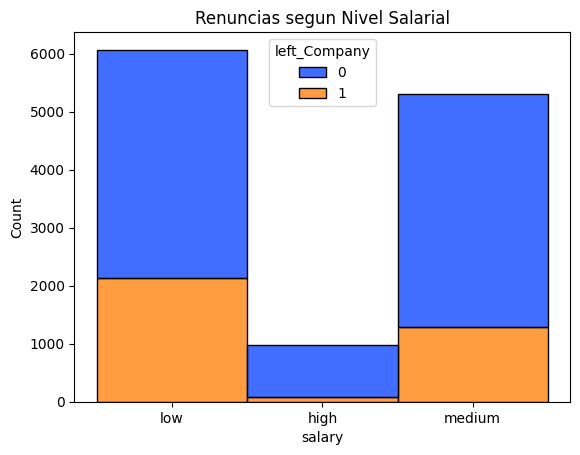

In [30]:
sns.histplot(data=ds1, x="salary", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun Nivel Salarial')

Los colaboradores de alto salario son los que menos renuncian

Text(0.5, 1.0, 'Renuncias segun Indentidad con la empresa')

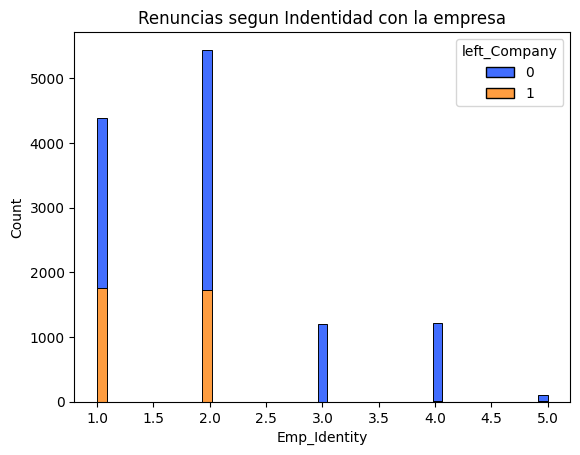

In [33]:
sns.histplot(data=ds1, x="Emp_Identity", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias segun Indentidad con la empresa') 

Todos los renunciantes tenian una baja identificacion con la compañía

Text(0.5, 1.0, 'Renuncia de Recursos Críticos')

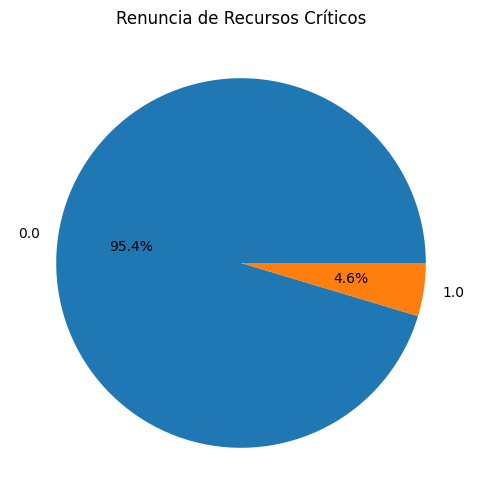

In [ ]:
ds2D=ds2[['ID', 'Critical']].groupby(by='Critical').count()
ds2D
fig,ax = plt.subplots(figsize =(10, 6))
ax.pie(ds2D.ID, labels = ds2D.index,autopct='%1.1f%%')
ax.set_title('Renuncia de Recursos Críticos')

El 95.4 % de los colaboradores que renuncias no son Críticos.

Text(0.5, 1.0, 'Renunciados promotion_last_5years')

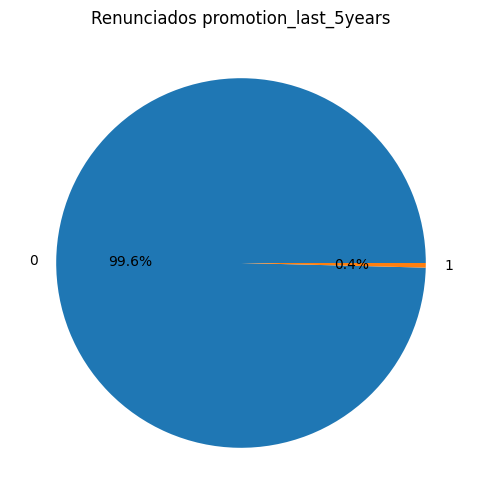

In [61]:
ds2D=ds2[['ID', 'promotion_last_5years']].groupby(by='promotion_last_5years').count()
ds2D
fig,ax = plt.subplots(figsize =(10, 6))
ax.pie(ds2D.ID, labels = ds2D.index,autopct='%1.1f%%')
ax.set_title('Renunciados promotion_last_5years')

Mas del 99% de los renunciantes no obtuvo promociones en los ultimos 5 años

Text(0.5, 1.0, 'Renuncias según Nivel de Engagement')

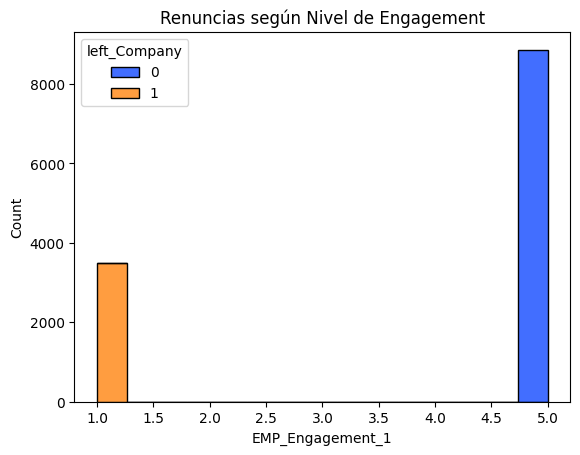

In [36]:
sns.histplot(data=ds1, x="EMP_Engagement_1", hue="left_Company", multiple="stack", palette='bright')
plt.title('Renuncias según Nivel de Engagement')

Las encuestas de Engagement aportan una valoración del compromiso de los colaboradores.

Analizando la relacion entre los resultados de Encuesta de Engagement y las renuncias, encontramos que el 100% de los colaboradores con bajo Engagement renunciaron.

Mientas que el 100% de los colaboradores que con altos niveles de Engagement en las encuestas no renunciaron.


Text(0.5, 1.0, 'Renuncias según nivel de Engagement')

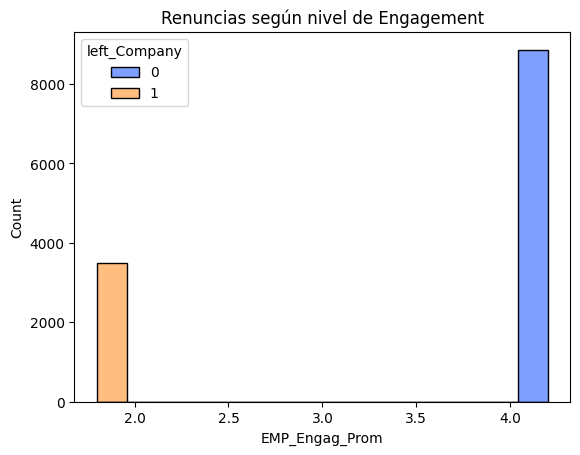

In [37]:
sns.histplot(data=ds1, x="EMP_Engag_Prom", hue="left_Company",  palette='bright')
plt.title('Renuncias según nivel de Engagement')

Calculamos el promedio de las 5 encuestas de Engagemente de las que se cuenta con información, y se mantiene la relación: con bajo nivel de Engagement el 100% de los colaboradores renuncia, mientras que el 100% de los colaboradores con alto Engagement o conmpromiso no renuncia.

In [38]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [39]:
import pandas_profiling

<ipython-input-39-6a00893fb3e1>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [40]:
#Principales medidas estadisticas
ds1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,12355.0,6809.119790,4306.687772,1.00,3110.50,6236.00,10557.50,14868.0
Will_Relocate,12355.0,0.499636,0.500020,0.00,0.00,0.00,1.00,1.0
Critical,12355.0,0.038527,0.192472,0.00,0.00,0.00,0.00,1.0
Percent_Remote,12355.0,0.580121,0.192177,0.40,0.40,0.50,0.80,0.8
EMP_Sat_OnPrem_1,12355.0,3.000000,0.000000,3.00,3.00,3.00,3.00,3.0
EMP_Sat_OnPrem_2,12355.0,2.680777,0.732520,1.00,3.00,3.00,3.00,3.0
EMP_Sat_OnPrem_3,12355.0,3.680777,0.732520,2.00,4.00,4.00,4.00,4.0
EMP_Sat_OnPrem_4,12355.0,2.680777,0.732520,1.00,3.00,3.00,3.00,3.0
EMP_Sat_OnPrem_5,12355.0,3.933549,1.358168,1.00,4.00,4.00,5.00,5.0
EMP_Sat_Remote_1,12355.0,2.741724,0.746848,2.00,2.00,3.00,3.00,5.0


In [41]:
#Data Profiling
profile = pandas_profiling.ProfileReport(ds1)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Insights

Podemos establecer el Perfil del Renunciante: 
*  No fue promovido en los últimos 5 años!
*  No se indentifica con la Compañia.
*  No es un Recurso Crítico!
*  No está comprometico con la Compañia.


# Recomendaciones


*  Diseñar acciones de retención con un costo inferior al sueldo anual del colaborador, con foco en esos colaboradores.

*  Estaremos generando una GANANCIA.

*  Estaremos traccionando ademas otros indicadores de la compañía